# Импортирование библиотек

In [28]:
from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep

import rasterio as rio
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image

import matplotlib.pyplot as plt
import numpy as np
import numpy.ma as ma
from scipy import stats as st
from matplotlib.colors import ListedColormap

from scipy.io import loadmat
from sklearn.metrics import classification_report, accuracy_score

import plotly.graph_objects as go

import pylab as plt
from matplotlib.path import Path

np.seterr(divide='ignore', invalid='ignore')

{'divide': 'ignore', 'over': 'warn', 'under': 'ignore', 'invalid': 'ignore'}

## Загрузка реальных данных о пастбище в формате .jp2
## дата: 2022/08/10

In [3]:
S_sentinel_bands = glob("./real_world_data/*B?*.jp2")
S_sentinel_bands.sort()
S_sentinel_bands

['./real_world_data\\T42UWF_20220810T062641_B01.jp2',
 './real_world_data\\T42UWF_20220810T062641_B02.jp2',
 './real_world_data\\T42UWF_20220810T062641_B03.jp2',
 './real_world_data\\T42UWF_20220810T062641_B04.jp2',
 './real_world_data\\T42UWF_20220810T062641_B05.jp2',
 './real_world_data\\T42UWF_20220810T062641_B06.jp2',
 './real_world_data\\T42UWF_20220810T062641_B07.jp2',
 './real_world_data\\T42UWF_20220810T062641_B08.jp2',
 './real_world_data\\T42UWF_20220810T062641_B09.jp2',
 './real_world_data\\T42UWF_20220810T062641_B10.jp2',
 './real_world_data\\T42UWF_20220810T062641_B11.jp2',
 './real_world_data\\T42UWF_20220810T062641_B12.jp2',
 './real_world_data\\T42UWF_20220810T062641_B8A.jp2']

# Формирование стэка (3-х мерной матрицы) изображении

In [4]:
l = []
for i in S_sentinel_bands:
  with rio.open(i, 'r') as f:
    l.append(f.read(1))

In [5]:
print(len(l[0]), "пикселей || # Канал B01. Разрешение 60m") # Канал B01. Разрешеие (60 m)
print(len(l[1]), "пикселей || # Канал B02. Разрешение 10m") # Канал B02. Разрешеие (10 m)
print(len(l[2]), "пикселей || # Канал B03. Разрешение 10m") # Канал B03. Разрешеие (10 m)
print(len(l[3]), "пикселей || # Канал B04. Разрешение 10m") # Канал B04. Разрешеие (10 m)
print(len(l[4]), "пикселей || # Канал B05. Разрешение 20m") # Канал B05. Разрешеие (20 m)
print(len(l[5]), "пикселей || # Канал B06. Разрешение 20m") # Канал B06. Разрешеие (20 m)
print(len(l[6]), "пикселей || # Канал B07. Разрешение 20m") # Канал B07. Разрешеие (20 m)
print(len(l[7]), "пикселей || # Канал B08. Разрешение 10m") # Канал B08. Разрешеие (10 m)
print(len(l[8]), "пикселей || # Канал B09. Разрешение 20m") # Канал B09. Разрешеие (20 m)
print(len(l[9]), "пикселей || # Канал B10. Разрешение 60m") # Канал B10. Разрешеие (60 m)
print(len(l[10]), "пикселей || # Канал B11. Разрешение 60m") # Канал B11. Разрешеие (60 m)
print(len(l[11]), "пикселей || # Канал B12. Разрешение 20m") # Канал B12. Разрешеие (20 m)
print(len(l[12]), "пикселей || # Канал B8A. Разрешение 20m") # Канал B8A. Разрешеие (20 m)

1830 пикселей || # Канал B01. Разрешение 60m
10980 пикселей || # Канал B02. Разрешение 10m
10980 пикселей || # Канал B03. Разрешение 10m
10980 пикселей || # Канал B04. Разрешение 10m
5490 пикселей || # Канал B05. Разрешение 20m
5490 пикселей || # Канал B06. Разрешение 20m
5490 пикселей || # Канал B07. Разрешение 20m
10980 пикселей || # Канал B08. Разрешение 10m
1830 пикселей || # Канал B09. Разрешение 20m
1830 пикселей || # Канал B10. Разрешение 60m
5490 пикселей || # Канал B11. Разрешение 60m
5490 пикселей || # Канал B12. Разрешение 20m
5490 пикселей || # Канал B8A. Разрешение 20m


In [6]:
print(len(l[0]), "пикселей || # Канал B01. Разрешение 60m") # Канал B01. Разрешеие (60 m)
print(len(l[8]), "пикселей || # Канал B09. Разрешение 20m !!!") # Канал B09. Разрешеие (20 m) -> (60 m)
print(len(l[9]), "пикселей || # Канал B10. Разрешение 60m") # Канал B10. Разрешеие (60 m)
print()
print(len(l[4]), "пикселей || # Канал B05. Разрешение 20m") # Канал B05. Разрешеие (20 m)
print(len(l[5]), "пикселей || # Канал B06. Разрешение 20m") # Канал B06. Разрешеие (20 m)
print(len(l[6]), "пикселей || # Канал B07. Разрешение 20m") # Канал B07. Разрешеие (20 m)
print(len(l[10]), "пикселей || # Канал B11. Разрешение 60m !!!") # Канал B11. Разрешеие (60 m)  -> (20 m)
print(len(l[11]), "пикселей || # Канал B12. Разрешение 20m") # Канал B12. Разрешеие (20 m)
print(len(l[12]), "пикселей || # Канал B8A. Разрешение 20m") # Канал B8A. Разрешеие (20 m)
print()
print(len(l[1]), "пикселей || # Канал B02. Разрешение 10m") # Канал B02. Разрешеие (10 m)
print(len(l[2]), "пикселей || # Канал B03. Разрешение 10m") # Канал B03. Разрешеие (10 m)
print(len(l[3]), "пикселей || # Канал B04. Разрешение 10m") # Канал B04. Разрешеие (10 m)
print(len(l[7]), "пикселей || # Канал B08. Разрешение 10m") # Канал B08. Разрешеие (10 m)


1830 пикселей || # Канал B01. Разрешение 60m
1830 пикселей || # Канал B09. Разрешение 20m !!!
1830 пикселей || # Канал B10. Разрешение 60m

5490 пикселей || # Канал B05. Разрешение 20m
5490 пикселей || # Канал B06. Разрешение 20m
5490 пикселей || # Канал B07. Разрешение 20m
5490 пикселей || # Канал B11. Разрешение 60m !!!
5490 пикселей || # Канал B12. Разрешение 20m
5490 пикселей || # Канал B8A. Разрешение 20m

10980 пикселей || # Канал B02. Разрешение 10m
10980 пикселей || # Канал B03. Разрешение 10m
10980 пикселей || # Канал B04. Разрешение 10m
10980 пикселей || # Канал B08. Разрешение 10m


In [7]:
arr60_st = np.stack([l[0],l[8],l[9]])
arr20_st = np.stack([l[4],l[5],l[6],l[10],l[11],l[12]])
arr10_st = np.stack([l[1],l[2],l[3],l[7]])

# Разрешение 13-и каналов

In [8]:
print("Разрешение в 60 м: ")
print(f'Высота: {arr60_st.shape[1]}\nШирина: {arr60_st.shape[2]}\nКаналов: {arr60_st.shape[0]}')
print()

print("Разрешение в 20 м: ")
print(f'Высота: {arr20_st.shape[1]}\nШирина: {arr20_st.shape[2]}\nКаналов: {arr20_st.shape[0]}')
print()

print("Разрешение в 10 м: ")
print(f'Высота: {arr10_st.shape[1]}\nШирина: {arr10_st.shape[2]}\nКаналов: {arr10_st.shape[0]}')

Разрешение в 60 м: 
Высота: 1830
Ширина: 1830
Каналов: 3

Разрешение в 20 м: 
Высота: 5490
Ширина: 5490
Каналов: 6

Разрешение в 10 м: 
Высота: 10980
Ширина: 10980
Каналов: 4


# Визуализация данных с 12-и каналов

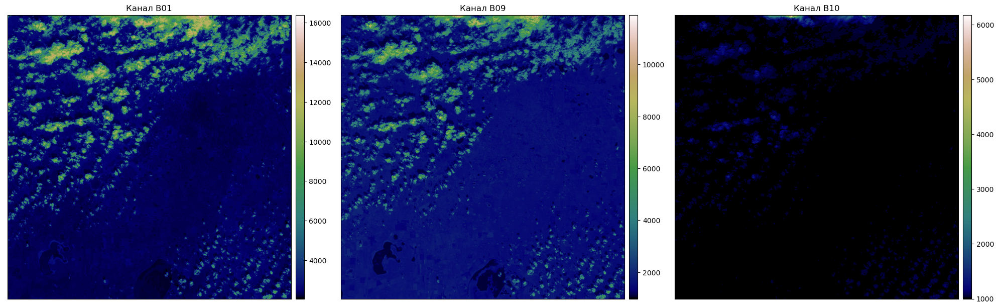

In [28]:
titles = ["Канал В01", "Канал В09", "Канал В10"]
ep.plot_bands(arr60_st, title=titles, cmap = 'gist_earth', figsize = (20, 20), cols = 3, cbar = True)
plt.show()

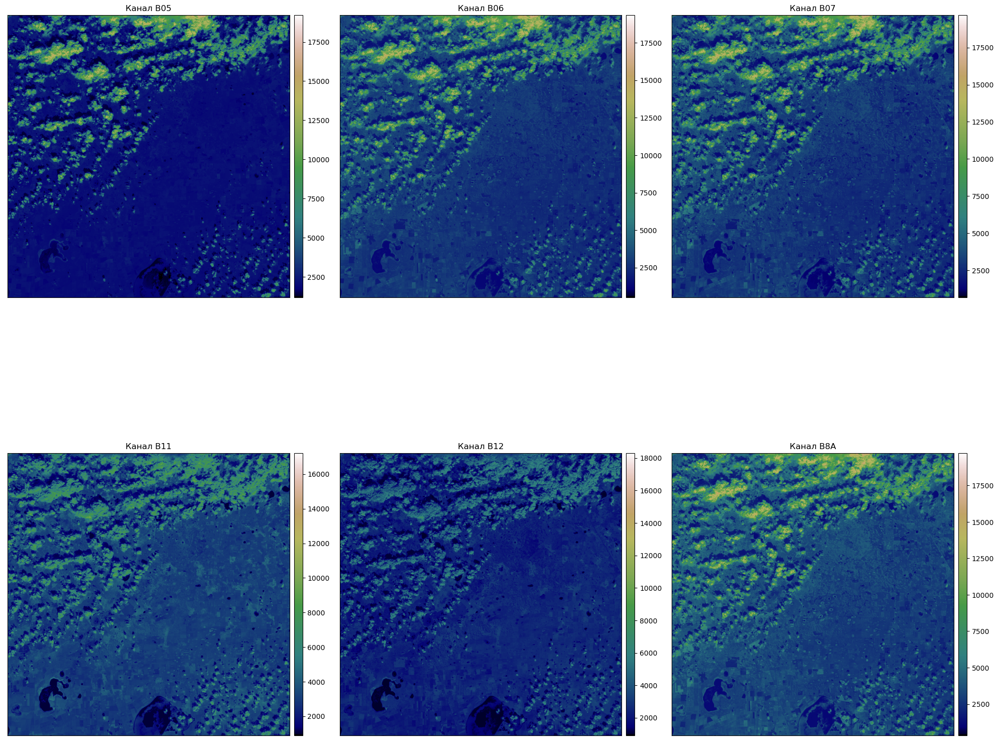

In [30]:
titles = ["Канал В05", "Канал В06", "Канал В07", "Канал В11", "Канал В12", "Канал В8A"]
ep.plot_bands(arr20_st, title=titles, cmap = 'gist_earth', figsize = (20, 20), cols = 3, cbar = True)
plt.show()

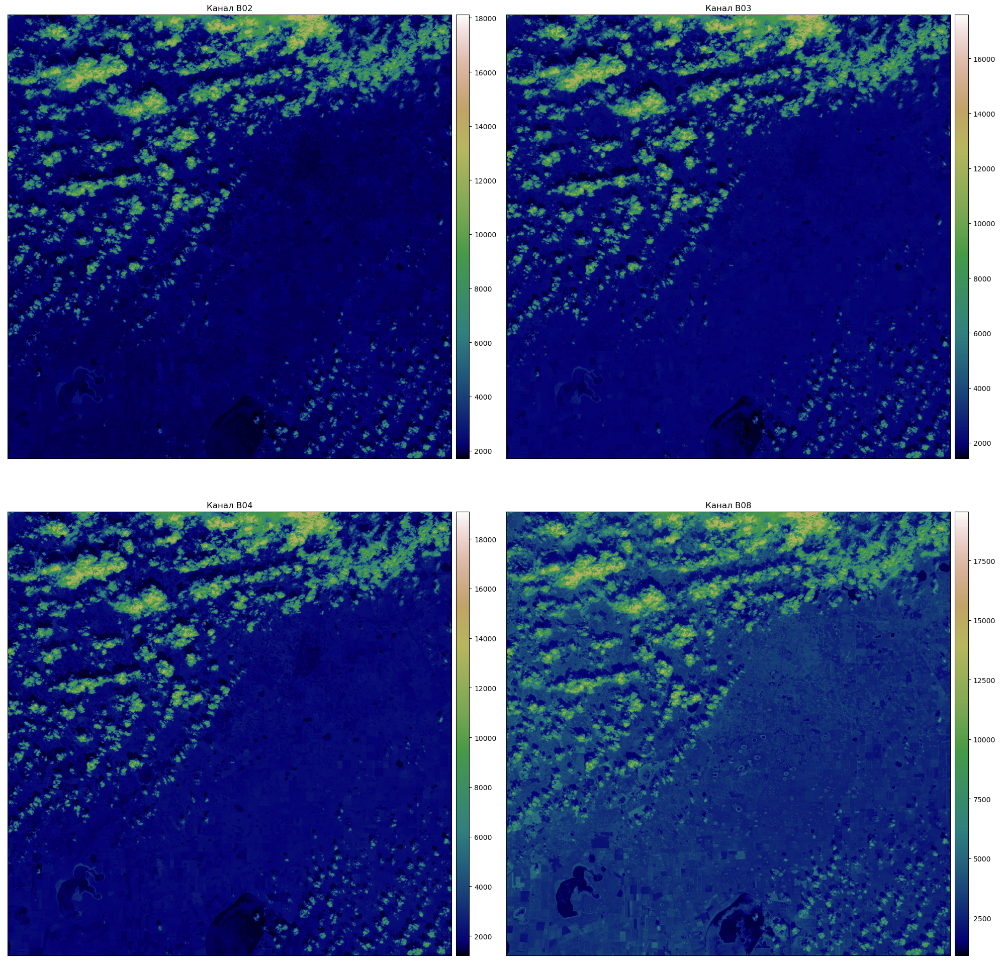

In [43]:
titles = ["Канал В02", "Канал В03", "Канал В04", "Канал В08"]
ep.plot_bands(arr10_st, title=titles, cmap = 'gist_earth', figsize = (20, 20), cols = 2, cbar = True)
plt.show()

# Композитное RGB изображение

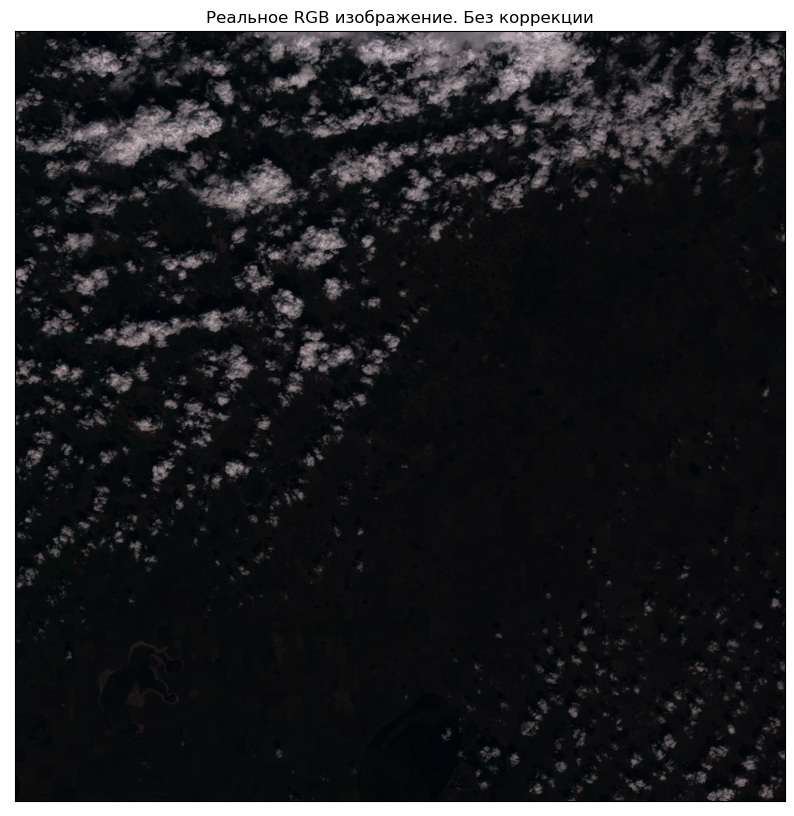

In [34]:
rgb = ep.plot_rgb(arr10_st, 
                  rgb=(2,1,0), 
                  figsize=(10, 10), 
                  title='Реальное RGB изображение. Без коррекции'
                  )

plt.show()

# Композитное RGB изображение (2)

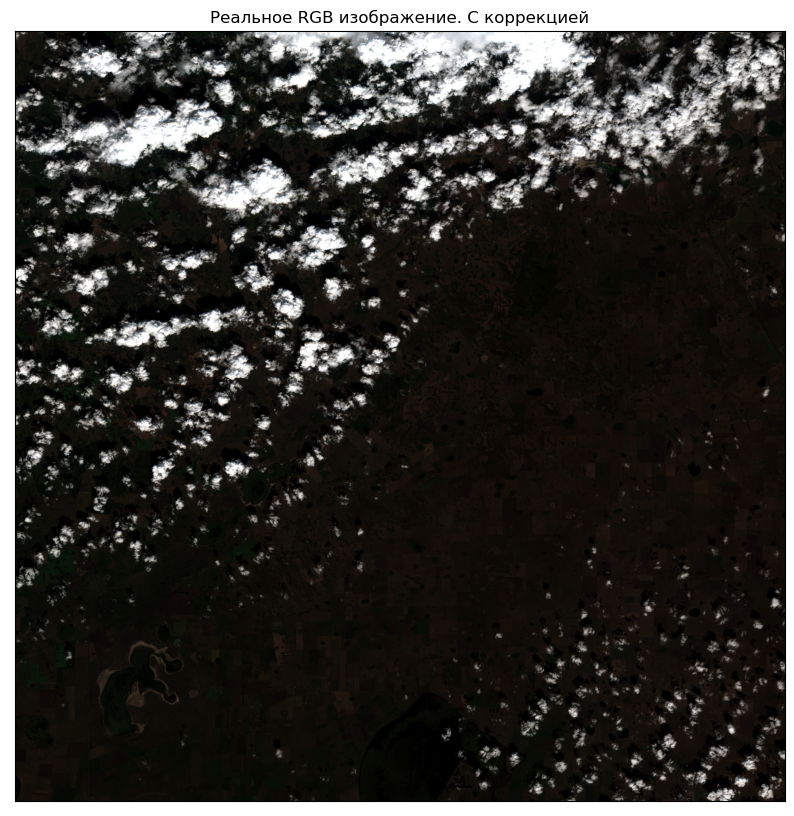

In [38]:
ep.plot_rgb(
    arr10_st,
    rgb=(2, 1, 0),
    stretch=True,
    str_clip=2,
    figsize=(10, 10),
    title="Реальное RGB изображение. С коррекцией",
)

plt.show()

# Гистограмма данных по 12-и каналам

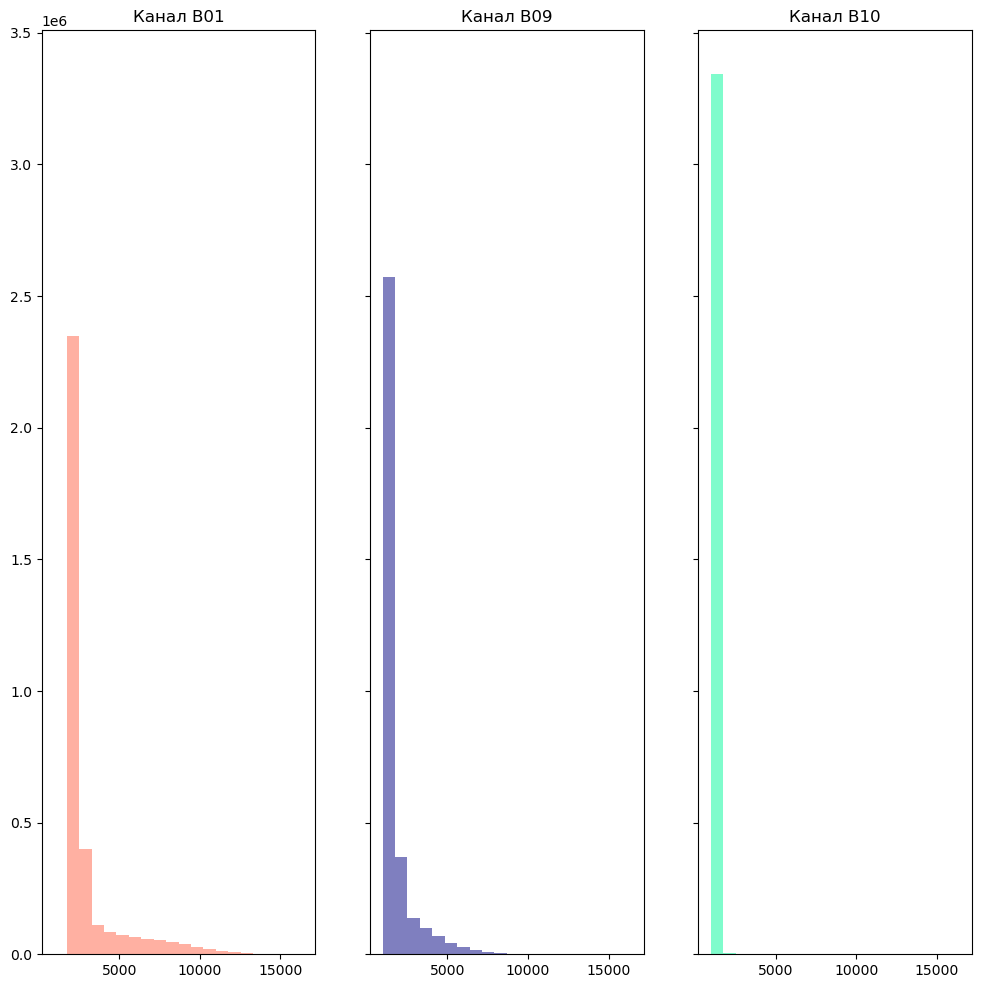

In [39]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']
titles = ["Канал В01", "Канал В09", "Канал В10"]

ep.hist(arr60_st, 
         colors = colors,
        title=titles, 
        cols=3, 
        alpha=0.5, 
        figsize = (12, 12)
        )

plt.show()

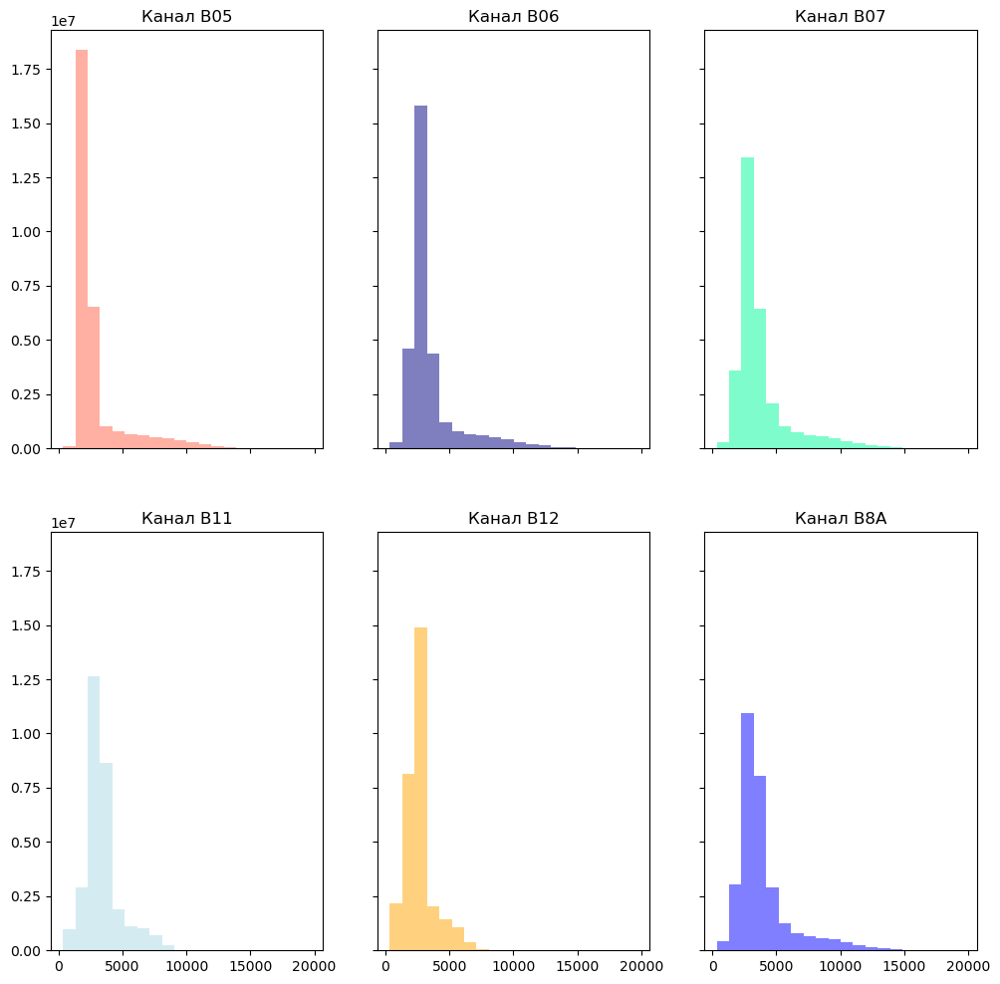

In [40]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']
titles = ["Канал В05", "Канал В06", "Канал В07", "Канал В11", "Канал В12", "Канал В8A"]

ep.hist(arr20_st, 
         colors = colors,
        title=titles, 
        cols=3, 
        alpha=0.5, 
        figsize = (12, 12)
        )

plt.show()

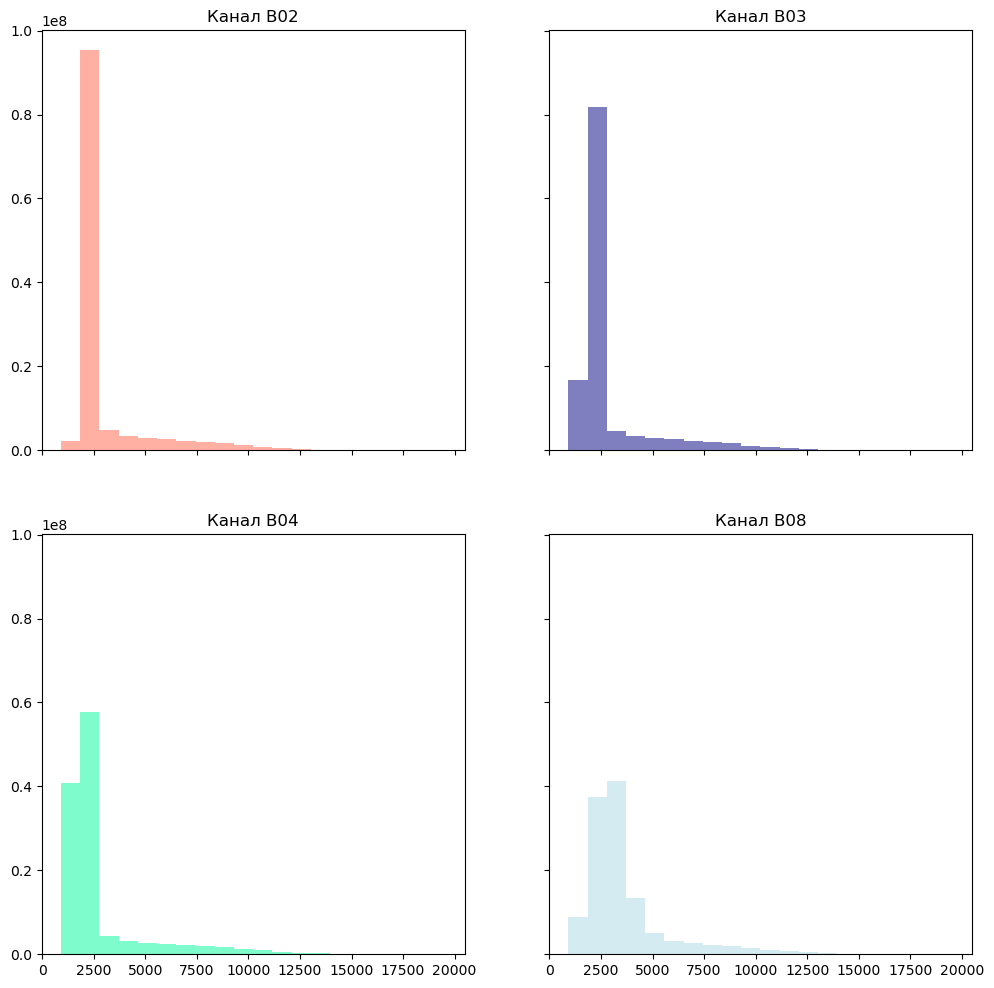

In [44]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']
titles = ["Канал В02", "Канал В03", "Канал В04", "Канал В08"]

ep.hist(arr10_st, 
         colors = colors,
        title=titles, 
        cols=2, 
        alpha=0.5, 
        figsize = (12, 12)
        )

plt.show()

# Normalized Difference Vegetation Index (NDVI) 
### NDVI = ((NIR - Red)/(NIR + Red))

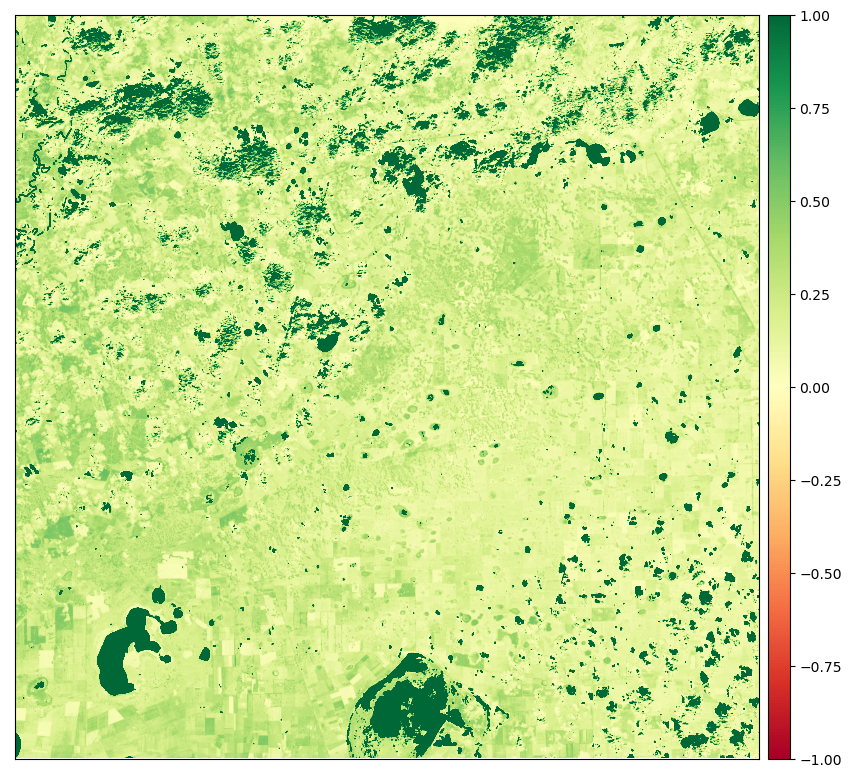

In [66]:
ndvi = es.normalized_diff(arr10_st[3], arr10_st[2])

ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Soil Adjusted Vegetation Index (SAVI)
### SAVI = ((NIR - Red) / (NIR + Red + L)) x (1 + L)

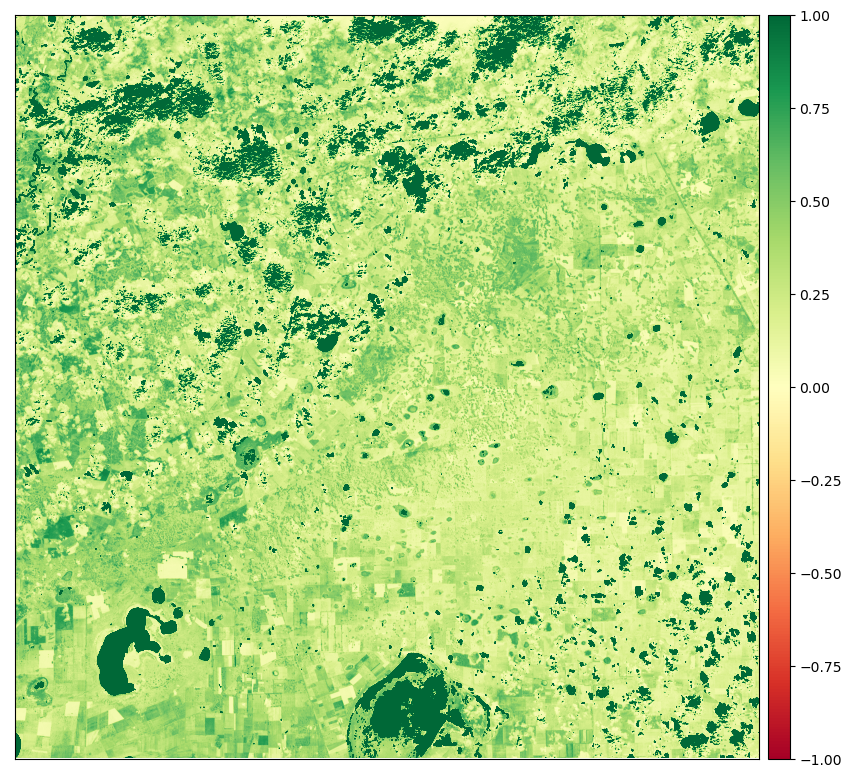

In [65]:
L = 0.5

savi = ((arr10_st[3] - arr10_st[2]) / (arr10_st[3] + arr10_st[2] + L)) * (1 + L)

ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Попытка обрезать изображения
##  (выделить только пастбище)

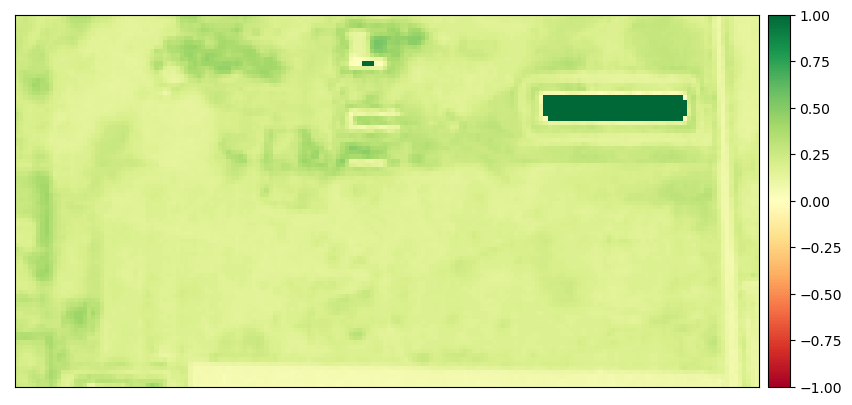

In [67]:
dim_size = arr10_st.shape[1]
x_axis_cut1 = int(np.interp(225, [0,747], [0,dim_size])) # Левая грань
x_axis_cut2 = int(np.interp(237, [0,747], [0,dim_size])) # Правая грань
y_axis_cut1 = int(np.interp(626, [0,747], [0,dim_size])) # Вверняя грань
y_axis_cut2 = int(np.interp(632, [0,747], [0,dim_size])) # Нижняя грань

test10_arr = arr10_st[:, y_axis_cut1:y_axis_cut2, x_axis_cut1:x_axis_cut2]

dim_size = arr20_st.shape[1]
x_axis_cut1 = int(np.interp(225, [0,747], [0,dim_size])) # Левая грань
x_axis_cut2 = int(np.interp(237, [0,747], [0,dim_size])) # Правая грань
y_axis_cut1 = int(np.interp(626, [0,747], [0,dim_size])) # Вверняя грань
y_axis_cut2 = int(np.interp(632, [0,747], [0,dim_size])) # Нижняя грань

test20_arr = arr20_st[:, y_axis_cut1:y_axis_cut2, x_axis_cut1:x_axis_cut2]

dim_size = arr60_st.shape[1]
x_axis_cut1 = int(np.interp(225, [0,747], [0,dim_size])) # Левая грань
x_axis_cut2 = int(np.interp(237, [0,747], [0,dim_size])) # Правая грань
y_axis_cut1 = int(np.interp(626, [0,747], [0,dim_size])) # Вверняя грань
y_axis_cut2 = int(np.interp(632, [0,747], [0,dim_size])) # Нижняя грань

test60_arr = arr60_st[:, y_axis_cut1:y_axis_cut2, x_axis_cut1:x_axis_cut2]


ndvi = es.normalized_diff(test10_arr[3], test10_arr[2])
ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

In [10]:
test10_arr.shape

(4, 88, 176)

# Маска Загона №1

In [11]:
width, height = 176, 88

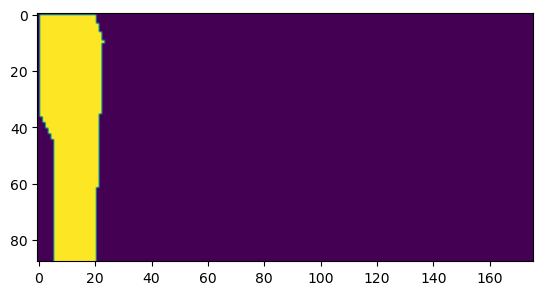

In [12]:
polygon1=[(int(0*width), int(0*height)), (int(0*width), int(0.23*height)), (int(0.06*width), int(0.27*height)), (int(0.5*width), int(0.23*height)), (int(0.5*width), int(0.06*height)), (int(0.26*width), int(0.06*height)), (int(0.20*width), int(0*height))]
poly_path1=Path(polygon1)

x1, y1 = np.mgrid[:height, :width]
coors1=np.hstack((x1.reshape(-1, 1), y1.reshape(-1,1))) # coors.shape is (4000000,2)

mask1 = poly_path1.contains_points(coors1)
plt.imshow(mask1.reshape(height, width))
plt.show()

# Маска Загона №2

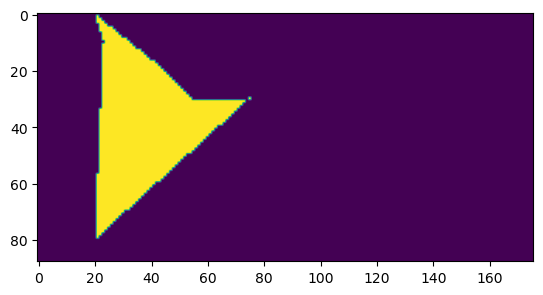

In [13]:
polygon2=[(int(0*width), int(0.23*height)), (int(0.115*width), int(0.52*height)), (int(0.175*width), int(0.63*height)), (int(0.175*width), int(0.86*height)), (int(0.46*width), int(0.23*height)), (int(0.06*width), int(0.27*height))]
poly_path2=Path(polygon2)

x2, y2 = np.mgrid[:height, :width]
coors2=np.hstack((x2.reshape(-1, 1), y2.reshape(-1,1))) # coors.shape is (4000000,2)

mask2 = poly_path2.contains_points(coors2)
plt.imshow(mask2.reshape(height, width))
plt.show()

# Маска Загона №3

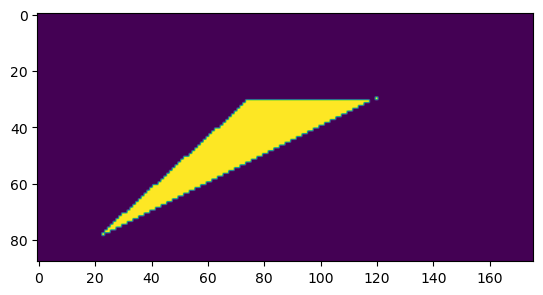

In [14]:
polygon3=[(int(0.175*width), int(0.86*height)), (int(0.175*width), int(1.37*height)), (int(0.46*width), int(0.23*height))]
poly_path3=Path(polygon3)

x3, y3 = np.mgrid[:height, :width]
coors3=np.hstack((x3.reshape(-1, 1), y3.reshape(-1,1))) # coors.shape is (4000000,2)

mask3 = poly_path3.contains_points(coors3)
plt.imshow(mask3.reshape(height, width))
plt.show()

# Маска Загона №4

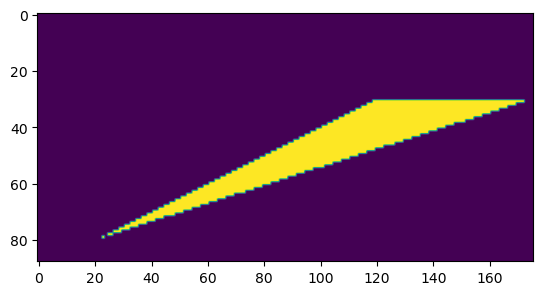

In [15]:
polygon4=[(int(0.175*width), int(1.37*height)), (int(0.175*width), int(2*height)), (int(0.46*width), int(0.23*height))]
poly_path4=Path(polygon4)

x4, y4 = np.mgrid[:height, :width]
coors4=np.hstack((x4.reshape(-1, 1), y4.reshape(-1,1))) # coors.shape is (4000000,2)

mask4 = poly_path4.contains_points(coors4)
plt.imshow(mask4.reshape(height, width))
plt.show()

# Маска Загона №5

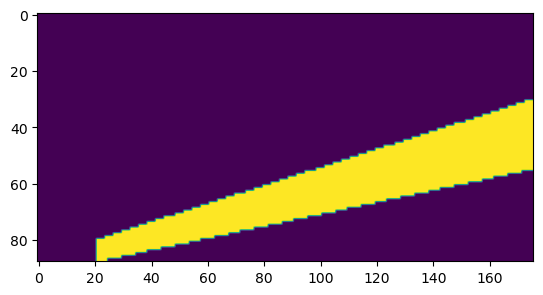

In [16]:
polygon5=[(int(0.175*width), int(2*height)), (int(0.315*width), int(2*height)), (int(0.5*width), int(0.23*height)), (int(0.46*width), int(0.23*height))]
poly_path5=Path(polygon5)

x5, y5 = np.mgrid[:height, :width]
coors5=np.hstack((x5.reshape(-1, 1), y5.reshape(-1,1))) # coors.shape is (4000000,2)

mask5 = poly_path5.contains_points(coors5)
plt.imshow(mask5.reshape(height, width))
plt.show()

# Маска Загона №6

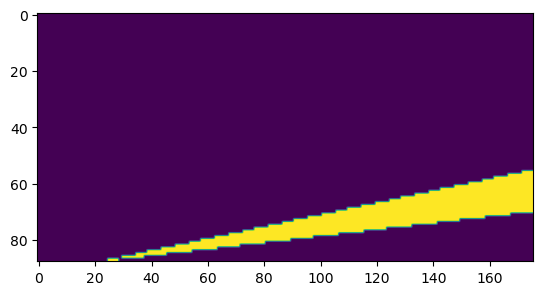

In [17]:
polygon6=[(int(0.315*width), int(2*height)), (int(0.4*width), int(2*height)), (int(0.5*width), int(0.23*height))]
poly_path6=Path(polygon6)

x6, y6 = np.mgrid[:height, :width]
coors6=np.hstack((x6.reshape(-1, 1), y6.reshape(-1,1))) # coors.shape is (4000000,2)

mask6 = poly_path6.contains_points(coors6)
plt.imshow(mask6.reshape(height, width))
plt.show()

# Маска Загона №7

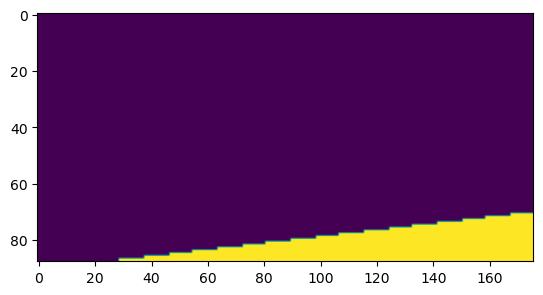

In [18]:
polygon7=[(int(0.4*width), int(2*height)), (int(0.5*width), int(2*height)), (int(0.5*width), int(0.23*height))]
poly_path7=Path(polygon7)

x7, y7 = np.mgrid[:height, :width]
coors7=np.hstack((x7.reshape(-1, 1), y7.reshape(-1,1))) # coors.shape is (4000000,2)

mask7 = poly_path7.contains_points(coors7)
plt.imshow(mask7.reshape(height, width))
plt.show()

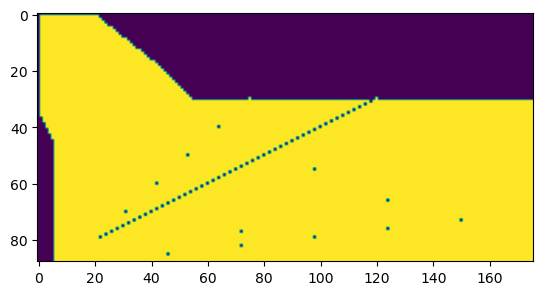

In [19]:
plt.imshow((mask1+mask2+mask3+mask4+mask5+mask6+mask7).reshape(height, width))

In [51]:
mx1 = ma.masked_array(ndvi, mask=mask1.reshape(height, width))
mx2 = ma.masked_array(ndvi, mask=mask2.reshape(height, width))
mx3 = ma.masked_array(ndvi, mask=mask3.reshape(height, width))
mx4 = ma.masked_array(ndvi, mask=mask4.reshape(height, width))
mx5 = ma.masked_array(ndvi, mask=mask5.reshape(height, width))
mx6 = ma.masked_array(ndvi, mask=mask6.reshape(height, width))
mx7 = ma.masked_array(ndvi, mask=mask7.reshape(height, width))

In [52]:
print("Загон №1. Среднее значение NDVI: ", mx1.mean())
print("Загон №2. Среднее значение NDVI: ", mx2.mean())
print("Загон №3. Среднее значение NDVI: ", mx3.mean())
print("Загон №4. Среднее значение NDVI: ", mx4.mean())
print("Загон №5. Среднее значение NDVI: ", mx5.mean())
print("Загон №6. Среднее значение NDVI: ", mx6.mean())
print("Загон №7. Среднее значение NDVI: ", mx7.mean())

Загон №1. Среднее значение NDVI:  0.516997062192818
Загон №2. Среднее значение NDVI:  0.5272426212141487
Загон №3. Среднее значение NDVI:  0.5087406299106926
Загон №4. Среднее значение NDVI:  0.5161010781738408
Загон №5. Среднее значение NDVI:  0.546025032402051
Загон №6. Среднее значение NDVI:  0.5129360205400951
Загон №7. Среднее значение NDVI:  0.5201874698695615


In [63]:
print("Загон №1. Медианное значение NDVI: ", ma.median(mx1))
print("Загон №2. Медианное значение NDVI: ", ma.median(mx2))
print("Загон №3. Медианное значение NDVI: ", ma.median(mx3))
print("Загон №4. Медианное значение NDVI: ", ma.median(mx4))
print("Загон №5. Медианное значение NDVI: ", ma.median(mx5))
print("Загон №6. Медианное значение NDVI: ", ma.median(mx6))
print("Загон №7. Медианное значение NDVI: ", ma.median(mx7))

Загон №1. Медианное значение NDVI:  0.18596881959910913
Загон №2. Медианное значение NDVI:  0.19219934994582882
Загон №3. Медианное значение NDVI:  0.1890019484736956
Загон №4. Медианное значение NDVI:  0.19017328361482783
Загон №5. Медианное значение NDVI:  0.1893636016590807
Загон №6. Медианное значение NDVI:  0.19052609515824775
Загон №7. Медианное значение NDVI:  0.19086316714254337


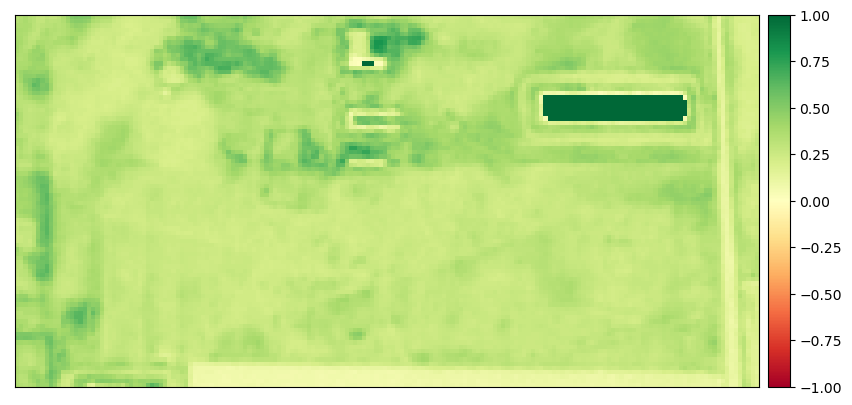

In [69]:
dim_size = arr10_st.shape[1]
x_axis_cut1 = int(np.interp(225, [0,747], [0,dim_size])) # Левая грань
x_axis_cut2 = int(np.interp(237, [0,747], [0,dim_size])) # Правая грань
y_axis_cut1 = int(np.interp(626, [0,747], [0,dim_size])) # Вверняя грань
y_axis_cut2 = int(np.interp(632, [0,747], [0,dim_size])) # Нижняя грань

test10_arr = arr10_st[:, y_axis_cut1:y_axis_cut2, x_axis_cut1:x_axis_cut2]

dim_size = arr20_st.shape[1]
x_axis_cut1 = int(np.interp(225, [0,747], [0,dim_size])) # Левая грань
x_axis_cut2 = int(np.interp(237, [0,747], [0,dim_size])) # Правая грань
y_axis_cut1 = int(np.interp(626, [0,747], [0,dim_size])) # Вверняя грань
y_axis_cut2 = int(np.interp(632, [0,747], [0,dim_size])) # Нижняя грань

test20_arr = arr20_st[:, y_axis_cut1:y_axis_cut2, x_axis_cut1:x_axis_cut2]

dim_size = arr60_st.shape[1]
x_axis_cut1 = int(np.interp(225, [0,747], [0,dim_size])) # Левая грань
x_axis_cut2 = int(np.interp(237, [0,747], [0,dim_size])) # Правая грань
y_axis_cut1 = int(np.interp(626, [0,747], [0,dim_size])) # Вверняя грань
y_axis_cut2 = int(np.interp(632, [0,747], [0,dim_size])) # Нижняя грань

test60_arr = arr60_st[:, y_axis_cut1:y_axis_cut2, x_axis_cut1:x_axis_cut2]


savi = ((test10_arr[3] - test10_arr[2]) / (test10_arr[3] + test10_arr[2] + L)) * (1 + L)

ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

In [70]:
mx1 = ma.masked_array(savi, mask=mask1.reshape(height, width))
mx2 = ma.masked_array(savi, mask=mask2.reshape(height, width))
mx3 = ma.masked_array(savi, mask=mask3.reshape(height, width))
mx4 = ma.masked_array(savi, mask=mask4.reshape(height, width))
mx5 = ma.masked_array(savi, mask=mask5.reshape(height, width))
mx6 = ma.masked_array(savi, mask=mask6.reshape(height, width))
mx7 = ma.masked_array(savi, mask=mask7.reshape(height, width))

In [71]:
print("Загон №1. Среднее значение SAVI: ", mx1.mean())
print("Загон №2. Среднее значение SAVI: ", mx2.mean())
print("Загон №3. Среднее значение SAVI: ", mx3.mean())
print("Загон №4. Среднее значение SAVI: ", mx4.mean())
print("Загон №5. Среднее значение SAVI: ", mx5.mean())
print("Загон №6. Среднее значение SAVI: ", mx6.mean())
print("Загон №7. Среднее значение SAVI: ", mx7.mean())

Загон №1. Среднее значение SAVI:  0.7753826829614143
Загон №2. Среднее значение SAVI:  0.7907488799448522
Загон №3. Среднее значение SAVI:  0.7630003320309587
Загон №4. Среднее значение SAVI:  0.7740393532162829
Загон №5. Среднее значение SAVI:  0.8189177036745099
Загон №6. Среднее значение SAVI:  0.7692927507917414
Загон №7. Среднее значение SAVI:  0.7801685114687518


In [72]:
print("Загон №1. Медианное значение SAVI: ", ma.median(mx1))
print("Загон №2. Медианное значение SAVI: ", ma.median(mx2))
print("Загон №3. Медианное значение SAVI: ", ma.median(mx3))
print("Загон №4. Медианное значение SAVI: ", ma.median(mx4))
print("Загон №5. Медианное значение SAVI: ", ma.median(mx5))
print("Загон №6. Медианное значение SAVI: ", ma.median(mx6))
print("Загон №7. Медианное значение SAVI: ", ma.median(mx7))

Загон №1. Медианное значение SAVI:  0.27892734527233926
Загон №2. Медианное значение SAVI:  0.2882677933051674
Загон №3. Медианное значение SAVI:  0.28347223725511417
Загон №4. Медианное значение SAVI:  0.2852286434916109
Загон №5. Медианное значение SAVI:  0.28401678927876106
Загон №6. Медианное значение SAVI:  0.2857591952216284
Загон №7. Медианное значение SAVI:  0.28626331393433624
